# Superkernel implementation

- encoder with cross-attention

In [1]:
import anndata
import json
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
from torchvision.transforms import RandomResizedCrop, Compose, RandomRotation, Lambda, RandomCrop
from torchvision.transforms.functional import crop
from torchvision.ops import sigmoid_focal_loss

from torch.utils.data import DataLoader
from tqdm import tqdm
from functools import partial
from typing import Callable, Tuple, Type, Dict, List, Literal, Union

from utils import DatasetFromTIFF, plot_markers, get_marker_names_map, plot_reconstructs, get_scheduler_with_warmup
import neptune
from transformers import get_cosine_schedule_with_warmup
import matplotlib.pyplot as plt


device = 'cuda' if torch.cuda.is_available() else 'mps' if torch.backends.mps.is_available() else 'cpu'

## Models classes

In [17]:
# from timm.models.convnext import ConvNeXtBlock
# from timm.models import ConvNeXt, VisionTransformer
from timm.layers import PatchEmbed
from modules import CustomConvNeXT, ConvNextBlock, MLP


class AttnBlock(nn.Module):
    def __init__(
            self, 
            embedding_dim : int, 
            num_heads: int, 
            mlp_ratio: float=4.,
            mlp_bias: bool=True,
        ):
        super(AttnBlock, self).__init__()
        self.num_heads = num_heads
        self.dim = embedding_dim

        self.attn = nn.MultiheadAttention(
            embed_dim=embedding_dim, 
            num_heads=num_heads, 
            batch_first=True
        )

        self.proj = nn.Linear(embedding_dim, embedding_dim)

        self.mlp = MLP(
            embedding_dim=embedding_dim,
            mlp_dim=int(embedding_dim * mlp_ratio),
            mlp_bias=mlp_bias
        )

        self.norm1 = nn.LayerNorm(embedding_dim)
        self.norm2 = nn.LayerNorm(embedding_dim)
        

    def forward(self, x, y):
        res = x
        x = self.norm1(x)
        x, _ = self.attn(x, y, y)
        x = self.proj(x)
        x += res

        res = x
        x = self.norm2(x)
        x = self.mlp(x)
        x += res

        return x


class Superkernel(nn.Module):
    def __init__(
            self, 
            num_channels: int,
            embedding_dim: int, 
            num_layers: int,
            num_heads: int,
            mlp_ratio: float,
            layer_type: Literal['conv', 'linear'],
            kernel_size: int = None,
            **kwargs
        ):
        """Initialize the Superkernel model

        Args:
            num_channels (int): Number of channels in the input tensor
            embedding_dim (int): Embedding dimension for the input tensor
            num_layers (int): Number of layers in the model
            num_heads (int): Number of heads per channel embedding
            mlp_ratio (float): MLP ratio for the model
            layer_type (Literal['conv', 'linear']): Whether the output of superkernel should be a convolutional or linear layer weights
            kernel_size (int, optional): Kernel size for the conv layer (already squared). Model embedding will be embedding_dim*kernel_size**2. 
                Number of heads should be a multiplication of squared kernel_size. Defaults to None.
        """
        super(Superkernel, self).__init__()
        self.embedding_dim = embedding_dim
        self.num_channels = num_channels
        self.num_layers = num_layers
        self.num_heads = num_heads
        self.layer_type = layer_type
        self.kernel_size = kernel_size

        model_dim = embedding_dim * kernel_size**2 if layer_type == 'conv' else embedding_dim 
        self.embedder = nn.Embedding(num_channels, model_dim)
        self.mask_embedding = nn.Parameter(torch.zeros(model_dim))

        # encoder_layer = nn.TransformerEncoderLayer(
        #     d_model=model_dim, 
        #     nhead=num_heads, 
        #     dim_feedforward=feedforward_dim,
        #     activation='gelu',
        #     batch_first=True
        # )
        # norm = nn.LayerNorm(model_dim) if layer_type == 'linear' else nn.GroupNorm(num_heads, model_dim)
        self.encoder = nn.ModuleList([
            AttnBlock(
                embedding_dim=model_dim, 
                num_heads=num_heads, 
                mlp_ratio=mlp_ratio,
                mlp_bias=True
            ) 
            for _ in range(num_layers)
        ])

    def forward(
            self,  
            channel_indices: torch.Tensor, 
            masked_indices: torch.Tensor = None
        ) -> torch.Tensor:
        B, C = channel_indices.shape

        x = self.embedder(channel_indices) # (B, C, E)

        # mask_embed = self.mask_embedding.reshape(1, 1, -1)
        # masked_x = self.embedder(masked_indices) + mask_embed # (B, C2, E)

        # x = torch.cat([x, masked_x], dim=1) # (B, C1 + C2, E)
        
        if self.num_layers > 0:
            for layer in self.encoder:
                x = layer(x, x) # (B, C', E)

        if self.layer_type == 'conv':
            # (B, W, C, K, K)
            x = x.reshape(B, C, self.kernel_size, self.kernel_size, self.embedding_dim).permute(0, 4, 1, 2, 3) 
            
        return x


class MultiplexImageEncoder(nn.Module):
    """Encoder backbone for encoding multiplex images."""

    def __init__(
            self,
            img_size: int,
            embed_dim: int,
            in_chans: int,
            patch_size: int,
            num_heads: int,
            num_blocks: int,
            add_cls_token: bool = True,
            mlp_ratio: float = 4.0,
            **kwargs
    ):
        """Initialize the Multiplex Image Encoder.

        Args:
            img_size (int): Size of the input image.
            embed_dim (int): Embedding dimension for the input tensor.
            patch_size (int): Size of the patch.
            num_heads (int): Number of heads in the transformer.
            num_blocks (int): Number of transformer blocks.
            add_cls_token (bool, optional): Whether to add a cls token. Defaults to True
            mlp_ratio (float): Ratio of the MLP dimension to the embedding dimension. Defaults to 4.0.
        """
        super().__init__()
        self.num_patches = (img_size // patch_size) ** 2
        self.embed_dim = embed_dim
        self.patch_size = patch_size
        self.num_heads = num_heads
        self.mlp_ratio = mlp_ratio
        self.num_blocks = num_blocks
        self.add_cls_token = add_cls_token

        self.patch_embed = PatchEmbed(
            img_size=img_size,
            patch_size=patch_size,
            in_chans=in_chans,
            embed_dim=embed_dim
        )

        self.act = nn.GELU()

        self.pos_embed = nn.Parameter(torch.randn(1, self.num_patches, embed_dim))
        if add_cls_token:
            self.cls_token = nn.Parameter(torch.randn(1, 1, embed_dim))
        
        self.encoder_self_atten = nn.ModuleList([
                AttnBlock(
                    embedding_dim=embed_dim, 
                    num_heads=num_heads, 
                    mlp_ratio=mlp_ratio,
                    mlp_bias=True
                )
            for _ in range(num_blocks)
        ])

        self.encoder_cross_atten = nn.ModuleList([
                AttnBlock(
                    embedding_dim=embed_dim, 
                    num_heads=num_heads, 
                    mlp_ratio=mlp_ratio,
                    mlp_bias=True
                )
            for _ in range(num_blocks)
        ])


    def forward(self, img: torch.Tensor, superkernel_embeds: torch.Tensor) -> torch.Tensor:
        B, C, E = superkernel_embeds.shape
        
        x = torch.einsum('bchw, bce -> behw', img, superkernel_embeds)
        x = self.act(x)
        # x = prenorm(x)
        x = self.patch_embed(x) # (B, N, E)
        if self.add_cls_token:
            cls_tokens = self.cls_token.expand(B, -1, -1)
            x = torch.cat((cls_tokens, x), dim=1)

        for self_attn, cross_attn in zip(self.encoder_self_atten, self.encoder_cross_atten):
            # x = cross_attn(x, superkernel_embeds)
            x = self_attn(x, x)
            

        return x


class MultiplexImageDecoder(nn.Module):
    """Decoder for restoring the multiplex image from the embedding tensor."""
    
    def __init__(
            self,
            input_embedding_dim: int,
            decoded_embed_dim: int,
            num_blocks: int,
            scaling_factor: int,
            num_channels: int,
            decoder_layer_type: Type = ConvNextBlock,
            **kwargs
        ) -> None:
            """
            Args:
                input_embedding_dim (int): Embedding dimension of the input tensor.
                decoded_embed_dim (int): Embedding dimension of the decoded tensor (before last projections).
                num_blocks (int): Number of multiplex blocks in each intermediate layer.
                scaling_factor (int): Scaling factor for the upsampling.
                num_channels (int): Number of output channels/markers.
                decoder_layer_type (Type, optional): Type of the decoder layer. Defaults to ConvNextBlock.
            """
            super().__init__()
            self.scaling_factor = scaling_factor
            self.num_channels = num_channels
            self.decoded_embed_dim = decoded_embed_dim

            self.channel_embed = nn.Embedding(num_channels, input_embedding_dim * decoded_embed_dim) # input projection
            self.channel_biases = nn.Embedding(num_channels, decoded_embed_dim)

            self.decoder = nn.Sequential(*[
                decoder_layer_type(
                    decoded_embed_dim, 
                    **kwargs
                ) for _ in range(num_blocks)
            ])
            self.pred = nn.Conv2d(decoded_embed_dim, scaling_factor**2, kernel_size=1)


    def forward(self, x: torch.Tensor, indices: torch.Tensor) -> torch.Tensor:
        """Forward pass of the Multiplex Image Decoder.

        Args:
            x (torch.Tensor): Input tensor (embedding).
            indices (torch.Tensor): Indices of the markers.

        Returns:
            torch.Tensor: Reconstructed image tensor
        """
        B, I, H, W = x.shape
        E, A = self.decoded_embed_dim, self.scaling_factor

        channel_embeds = self.channel_embed(indices) # [B, C, I*E]
        channel_biases = self.channel_biases(indices) # [B, C, E]
        C = channel_embeds.shape[1]
        N = B * C
        channel_embeds = channel_embeds.reshape(B, C, I, E)
        channel_biases = channel_biases.reshape(B, C, E, 1, 1)

        x = torch.einsum('bihw, bcie -> bcehw', x, channel_embeds)
        x += channel_biases
        x = x.reshape(N, E, H, W)

        x = self.decoder(x)
        x = self.pred(x)

        x = x.reshape(N, A, A, H, W).reshape(B, C, A, A, H, W)
        x = torch.einsum('bcxyhw -> bchxwy', x)
        # x = x.reshape(N, H*A, W*A).unsqueeze(1)

        # x = self.smooth_conv1(x)
        x = x.reshape(B, C, H*A, W*A)

        return x
    

class MultiplexTransformer(nn.Module):
    """Multiplex image Transformer with Superkernel and Multiplex Image Decoder."""

    def __init__(
            self, 
            num_channels: int,
            input_image_size: int,
            embedding_dim: int,
            superkernel_embedding_dim: int,
            superkernel_depth: int,
            superkernel_heads: int,
            superkernel_layer_type: Literal['linear'],
            encoder_config: Dict,
            decoder_config: Dict,
            superkernel_kernel_size: int = None,
            superkernel_conv_padding: int = None,
            mlp_ratio: float = 4.,
            **kwargs
            ):
        """Initialize the Multiplex Transformer model.

        Args:
            num_channels (int): Number of channels/markers in the dataset.
            input_image_size (int): Size of the input image.
            embedding_dim (int): Embedding dimension.
            superkernel_depth (int): Number of layers in the Superkernel model.
            superkernel_heads (int): Number of heads per channel embedding in the Superkernel model.
            superkernel_layer_type (Literal['linear']): Type of the Superkernel layer.
            encoder_config (Dict): Configuration for the encoder.
            decoder_config (Dict): Configuration for the decoder.
            superkernel_kernel_size (int, optional): Size of Superkernel kernel if conv type. Defaults to None.
            superkernel_conv_padding (int, optional): Convolution padding if conv type. Defaults to None.
            mlp_ratio (float, optional): MLP ratio. Defaults to 4..
        """
        super().__init__()
        self.num_channels = num_channels
        self.input_image_size = input_image_size
        self.embedding_dim = embedding_dim
        self.superkernel_embedding_dim = superkernel_embedding_dim
        self.superkernel_depth = superkernel_depth
        self.superkernel_heads = superkernel_heads
        self.superkernel_layer_type = superkernel_layer_type
        self.superkernel_kernel_size = superkernel_kernel_size
        self.superkernel_conv_padding = superkernel_conv_padding
        self.mlp_ratio = mlp_ratio
        self.num_patch_x = input_image_size // encoder_config['patch_size']


        self.superkernel = Superkernel(
            num_channels=num_channels, 
            embedding_dim=superkernel_embedding_dim, 
            num_layers=superkernel_depth, 
            num_heads=superkernel_heads, 
            mlp_ratio=mlp_ratio, 
            layer_type=superkernel_layer_type,
            kernel_size=superkernel_kernel_size,
            **kwargs
        )

        self.encoder = MultiplexImageEncoder(
            img_size=input_image_size,
            in_chans=superkernel_embedding_dim,
            embed_dim=embedding_dim,
            **encoder_config
        )

        self.decoder = MultiplexImageDecoder(
            **decoder_config
        )

    def forward(
            self, 
            x: torch.Tensor, 
            encoded_indices: torch.Tensor, 
            decoded_indices: torch.Tensor
        ) -> torch.Tensor:
        B, C = encoded_indices.shape
        superkernel_weights = self.superkernel(encoded_indices)

        x = self.encoder(x, superkernel_weights)
        latent, features = x[:, 0], x[:, 1:]

        x = features.permute(0, 2, 1).reshape(B, self.embedding_dim, self.num_patch_x, self.num_patch_x)

        x = self.decoder(x, decoded_indices)
        
        return x, latent


## Data preparation

In [3]:
TRAIN_DATA_PATH = '/Users/dawid/Desktop/uw/rok IV/sem VIII/DLLS/DeepLearningProject/data/train/images_masks/img'
TEST_DATA_PATH = '/Users/dawid/Desktop/uw/rok IV/sem VIII/DLLS/DeepLearningProject/data/test/images_masks/img'
VAL_DATA_PATH = '/Users/dawid/Desktop/uw/rok IV/sem VIII/DLLS/DeepLearningProject/data/val/images_masks/img'

SIZE = (112, 112)
BATCH_SIZE = 1

def crop_val(image):
    init_x, init_y = 0, 0
    return crop(image, init_y, init_x, init_y + SIZE[1], init_x + SIZE[0])

train_transform = Compose([
    RandomRotation(180),
    RandomCrop(SIZE),
])

test_transform = Lambda(crop_val)

train_dataset = DatasetFromTIFF(TRAIN_DATA_PATH, transform=train_transform)
val_dataset = DatasetFromTIFF(VAL_DATA_PATH, transform=test_transform)
test_dataset = DatasetFromTIFF(TEST_DATA_PATH, transform=test_transform)

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

train_anndata = anndata.read_h5ad('/Users/dawid/Desktop/uw/rok IV/sem VIII/DLLS/DeepLearningProject/data/train/cell_data.h5ad')
markers_names_map = get_marker_names_map(train_anndata)

marker_map = json.load(open('tokenizer_vocab.json'))
markers_names_map = {v: k for k, v in marker_map.items()}

## Training and testing scripts

### Normal autoencoder

In [4]:
# default train and test functions for autoencoder training and inference

def train(
        model, 
        optimizer,
        criterion, 
        scheduler,
        train_dataloader, 
        val_dataloader, 
        device, 
        run,
        epochs=10, 
        gradient_accumulation_steps=1,
        min_channels=30
    ):
    """Train a typical autoencoder (decode the same channel as the input) with the given parameters."""
    model.train()
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        for i, (img, channel_ids) in enumerate(tqdm(train_dataloader)):
            B, C, = channel_ids.shape
            num_sampled_channels = np.random.randint(min_channels, C+1)
            channels_subset_idx = np.random.choice(
                np.arange(C), 
                size=(B, num_sampled_channels), 
                replace=False
            )
            channels_subset_indices = torch.tensor(channels_subset_idx, dtype=torch.long)
            batch_indices = torch.arange(B, dtype=torch.long)

            img = img[batch_indices, channels_subset_indices].to(device)
            channel_ids = channel_ids[batch_indices, channels_subset_indices].to(device)

            img = img.to(torch.float32).to(device)
            channel_ids = channel_ids.to(device)
            output, _ = model(img, channel_ids, channel_ids)
            
            loss = criterion(output, img)
            loss.backward()
            
            if (i+1) % gradient_accumulation_steps == 0:
                optimizer.step()
                optimizer.zero_grad()
                scheduler.step()
                run['train/loss'].append(loss.item())
                run['train/lr'].append(scheduler.get_last_lr()[0])
            running_loss += loss.item()
                        
        # print(f'Epoch {epoch} loss: {running_loss / len(train_dataloader)}')
        val_loss, _, reconstr_img = test(model, criterion, val_dataloader, device)
        print(f'Validation loss: {val_loss}')
        run['val/loss'].append(val_loss)
        run['val/imgs'].append(reconstr_img, description=f'Reconstructed images (epoch {epoch})')
        plt.close('all')   
        

def test(model, criterion, test_dataloader, device):
    model.eval()
    running_loss = 0.0
    plot_idx = np.random.randint(0, len(test_dataloader))
    with torch.no_grad():
        for idx, (img, channel_ids) in enumerate(test_dataloader):
            img = img.to(torch.float32).to(device)
            channel_ids = channel_ids.to(device)
            output, _ = model(img, channel_ids, channel_ids)
            loss = criterion(output, img)
            running_loss += loss.item()

            if idx == plot_idx:
                recr_img = torch.sigmoid(output)
                orig_img, reconstr_img = plot_reconstructs(img, recr_img, channel_ids, markers_names_map)
    return running_loss / len(test_dataloader), orig_img, reconstr_img

### Masked autoencoder

In [5]:
def train_masked(
        model, 
        optimizer,
        criterion,
        scheduler,
        train_dataloader, 
        val_dataloader, 
        device, 
        epochs=10, 
        gradient_accumulation_steps=1,
        range_masked = (1, 20),
        mask_step=1,
        mask_step_iters=100,
        run=None
    ):
    """Train a masked autoencoder (decode the remaining channels) with the given parameters."""
    model.train()
    
    num_masked, max_masked = range_masked
    iters = 0
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        for batch_idx, (img, channel_ids) in enumerate(tqdm(train_dataloader, desc=f'Epoch {epoch}')):
            img = img.to(torch.float32)
            batch_size, num_channels = channel_ids.shape

            masked_indices = np.random.choice(num_channels, (batch_size, num_masked), replace=False)
            masked_indices = torch.tensor(masked_indices)

            masked_img = torch.stack([
                img[b, i] for b, i in enumerate(masked_indices)
            ]).to(device)

            visible_indices = torch.stack([
                torch.tensor([i for i in channel_ids[b] if i not in masked_indices[b]])
                for b in range(batch_size)
            ])

            visible_img = torch.stack([
                img[b, i] for b, i in enumerate(visible_indices)
            ]).to(device)

            masked_indices = masked_indices.to(device)
            visible_indices = visible_indices.to(device)

            output, _ = model(visible_img, visible_indices, masked_indices)
            loss = criterion(output, masked_img)
            loss.backward()
            if (batch_idx+1) % gradient_accumulation_steps == 0:
                optimizer.step()
                optimizer.zero_grad()
                scheduler.step()
                run['train/loss'].append(loss.item())
                run['train/lr'].append(scheduler.get_last_lr()[0])
                run['train/num_masked'].append(num_masked)
                
                iters += 1
                if iters % mask_step_iters == 0:
                    num_masked = min(num_masked + mask_step, max_masked)
            running_loss += loss.item()
                        
        # print(f'Epoch {epoch} loss: {running_loss / len(train_dataloader)}')
        val_loss = test_masked(model, criterion, val_dataloader, device, run, epoch, num_masked=num_masked)
        print(f'Validation loss: {val_loss:.4f}')


def test_masked(model, criterion, test_dataloader, device, run, epoch, num_masked=1, num_plots=5):
    model.eval()
    running_loss = 0.0
    plot_indices = np.random.choice(np.arange(len(test_dataloader)), size=num_plots, replace=False)
    plot_indices = set(plot_indices)
    rand_gen = torch.Generator().manual_seed(42)
    with torch.no_grad():
        for idx, (img, channel_ids) in enumerate(test_dataloader):
            img = img.to(torch.float32)
            batch_size, num_channels = channel_ids.shape
            
            # mask from idx % num_channels to idx + masked_channels % num_channels 
            # masked_indices = torch.tensor([(idx + i) % num_channels for i in range(num_masked)])
            # masked_indices = masked_indices.unsqueeze(0).repeat(batch_size, 1)
            random_perm = torch.randperm(num_channels, generator=rand_gen)
            masked_indices = random_perm[:num_masked].unsqueeze(0).repeat(batch_size, 1)
            
            visible_indices = torch.tensor([i for i in range(num_channels) if i not in masked_indices])
            visible_indices = visible_indices.unsqueeze(0).repeat(batch_size, 1)

            masked_img = torch.stack([
                img[b, i] for b, i in enumerate(masked_indices)
            ]).to(device)

            visible_img = torch.stack([
                img[b, i] for b, i in enumerate(visible_indices)
            ]).to(device)

            masked_indices = masked_indices.to(device)
            visible_indices = visible_indices.to(device)

            output, _ = model(visible_img, visible_indices, masked_indices)
            loss = criterion(output, masked_img)
            running_loss += loss.item()

            if idx in plot_indices:
                recr_img = torch.sigmoid(output)
                orig_img, reconstr_img = plot_reconstructs(img, recr_img, masked_indices, markers_names_map)
                run['val/imgs'].append(reconstr_img, description=f'Reconstructed images (epoch {epoch})')
                plt.close('all') 
                
    
    val_loss = running_loss / len(test_dataloader)
    run['val/loss'].append(val_loss)
    
    return val_loss

## Model: Linear Superkernel, ViT backbone

#### Masked autoencoder training

In [18]:
model_config = {
    'num_channels': 40,
    'input_image_size': 112,
    'superkernel_embedding_dim': 256,
    'embedding_dim': 768,
    'superkernel_depth': 6,
    'superkernel_heads': 8,
    'superkernel_layer_type': 'linear',
}

encoder_config = {
    'patch_size': 8,
    'num_heads': 8,
    'num_blocks': 8,
}

decoder_config = {
    'decoded_embed_dim': 512,
    'input_embedding_dim': 768,
    'num_blocks': 8,
    'scaling_factor': 8,
    'num_channels': 40,
    'decoder_layer_type': ConvNextBlock,
}

model1 = MultiplexTransformer(**model_config, encoder_config=encoder_config, decoder_config=decoder_config).to(device)

In [19]:
criterion = partial(sigmoid_focal_loss, reduction='mean')

lr = 5e-4
final_lr = 1e-6
weight_decay = 0.0001
gradient_accumulation_steps = 1
epochs = 50
num_warmup_steps = 200
num_annealing_steps = 5000
mask_step_iters = 200
optimizer1 = optim.AdamW(model1.parameters(), lr=lr, weight_decay=weight_decay)
scheduler = get_scheduler_with_warmup(optimizer1, num_warmup_steps, num_annealing_steps, final_lr=final_lr, type='const')

In [ ]:
run = neptune.init_run(
    project="dav3794/multiplex",
    api_token="==",
    tags=['ViT', 'linear superkernel', 'encoder without cross-attn', 'masked', ]
)

run["parameters"] = {
    "lr": lr,
    "weight_decay": weight_decay,
    "gradient_accumulation_steps": gradient_accumulation_steps,
    "epochs": epochs,
    "model_general_config": model_config,
    "encoder_config": encoder_config,
    "decoder_config": decoder_config,
}

[neptune] [info   ] Neptune initialized. Open in the app: https://app.neptune.ai/dav3794/multiplex/e/MUL-70


In [21]:
train_masked(
    model1, 
    optimizer1, 
    criterion, 
    scheduler,
    train_dataloader, 
    val_dataloader, 
    device, 
    epochs=epochs, 
    gradient_accumulation_steps=gradient_accumulation_steps,
    run=run,
    mask_step_iters=mask_step_iters
)

Epoch 0: 100%|██████████| 100/100 [00:51<00:00,  1.96it/s]


Validation loss: 3.5858


Epoch 1: 100%|██████████| 100/100 [00:51<00:00,  1.95it/s]


Validation loss: 0.7776


Epoch 2: 100%|██████████| 100/100 [00:57<00:00,  1.73it/s]


Validation loss: 0.4599


Epoch 3: 100%|██████████| 100/100 [00:57<00:00,  1.73it/s]


Validation loss: 0.3437


Epoch 4: 100%|██████████| 100/100 [01:03<00:00,  1.57it/s]


Validation loss: 0.2434


Epoch 5: 100%|██████████| 100/100 [01:03<00:00,  1.58it/s]


Validation loss: 0.2443


Epoch 6: 100%|██████████| 100/100 [01:08<00:00,  1.47it/s]


Validation loss: 0.1859


Epoch 7: 100%|██████████| 100/100 [01:08<00:00,  1.46it/s]


Validation loss: 0.1931


Epoch 8: 100%|██████████| 100/100 [01:13<00:00,  1.35it/s]


Validation loss: 0.1597


Epoch 9: 100%|██████████| 100/100 [01:13<00:00,  1.36it/s]


Validation loss: 2.0756


Epoch 10: 100%|██████████| 100/100 [01:18<00:00,  1.27it/s]


Validation loss: 0.1175


Epoch 11: 100%|██████████| 100/100 [01:17<00:00,  1.30it/s]


Validation loss: 0.1146


Epoch 12: 100%|██████████| 100/100 [01:22<00:00,  1.22it/s]


Validation loss: 0.0982


Epoch 13: 100%|██████████| 100/100 [01:22<00:00,  1.22it/s]


Validation loss: 0.1046


Epoch 14: 100%|██████████| 100/100 [01:26<00:00,  1.15it/s]


Validation loss: 0.0976


Epoch 15: 100%|██████████| 100/100 [01:27<00:00,  1.14it/s]


Validation loss: 0.0734


Epoch 16: 100%|██████████| 100/100 [01:32<00:00,  1.08it/s]


Validation loss: 0.0609


Epoch 17: 100%|██████████| 100/100 [01:32<00:00,  1.08it/s]


Validation loss: 0.0568


Epoch 18: 100%|██████████| 100/100 [01:37<00:00,  1.02it/s]


Validation loss: 0.0355


Epoch 19: 100%|██████████| 100/100 [01:36<00:00,  1.03it/s]


Validation loss: 0.0386


Epoch 20: 100%|██████████| 100/100 [01:41<00:00,  1.01s/it]


Validation loss: 0.0322


Epoch 21: 100%|██████████| 100/100 [01:39<00:00,  1.00it/s]


Validation loss: 0.0333


Epoch 22: 100%|██████████| 100/100 [01:45<00:00,  1.05s/it]


Validation loss: 0.0303


Epoch 23: 100%|██████████| 100/100 [01:43<00:00,  1.04s/it]


Validation loss: 0.0341


Epoch 24: 100%|██████████| 100/100 [01:48<00:00,  1.08s/it]


Validation loss: 0.0290


Epoch 25: 100%|██████████| 100/100 [01:48<00:00,  1.08s/it]


Validation loss: 0.0245


Epoch 26:  59%|█████▉    | 59/100 [01:07<00:46,  1.13s/it]

[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError


Epoch 26: 100%|██████████| 100/100 [01:53<00:00,  1.14s/it]


Validation loss: 0.0247


Epoch 27: 100%|██████████| 100/100 [01:53<00:00,  1.14s/it]


Validation loss: 0.0305


Epoch 28: 100%|██████████| 100/100 [01:59<00:00,  1.19s/it]


Validation loss: 0.0274


Epoch 29: 100%|██████████| 100/100 [02:00<00:00,  1.21s/it]


Validation loss: 0.0286


Epoch 30: 100%|██████████| 100/100 [02:05<00:00,  1.25s/it]


Validation loss: 0.0250


Epoch 31: 100%|██████████| 100/100 [02:05<00:00,  1.25s/it]


Validation loss: 0.0278


Epoch 32: 100%|██████████| 100/100 [02:09<00:00,  1.30s/it]


Validation loss: 0.0269


Epoch 33: 100%|██████████| 100/100 [02:08<00:00,  1.29s/it]


Validation loss: 0.0270


Epoch 34: 100%|██████████| 100/100 [02:15<00:00,  1.35s/it]


Validation loss: 0.0265


Epoch 35: 100%|██████████| 100/100 [02:13<00:00,  1.34s/it]


Validation loss: 0.0263


Epoch 36: 100%|██████████| 100/100 [02:18<00:00,  1.38s/it]


Validation loss: 0.0252


Epoch 37: 100%|██████████| 100/100 [02:18<00:00,  1.38s/it]


Validation loss: 0.0242


Epoch 38: 100%|██████████| 100/100 [02:22<00:00,  1.42s/it]


Validation loss: 0.0260


Epoch 39: 100%|██████████| 100/100 [02:23<00:00,  1.44s/it]


Validation loss: 0.0219


Epoch 40: 100%|██████████| 100/100 [02:22<00:00,  1.43s/it]


Validation loss: 0.0237


Epoch 41: 100%|██████████| 100/100 [02:24<00:00,  1.44s/it]


Validation loss: 0.0277


Epoch 42: 100%|██████████| 100/100 [02:22<00:00,  1.42s/it]


Validation loss: 0.0245


Epoch 43: 100%|██████████| 100/100 [02:22<00:00,  1.43s/it]


Validation loss: 0.0244


Epoch 44: 100%|██████████| 100/100 [02:22<00:00,  1.43s/it]


Validation loss: 0.0324


Epoch 45: 100%|██████████| 100/100 [02:23<00:00,  1.43s/it]


Validation loss: 0.0321


Epoch 46: 100%|██████████| 100/100 [02:22<00:00,  1.43s/it]


Validation loss: 0.0265


Epoch 47: 100%|██████████| 100/100 [02:23<00:00,  1.43s/it]


Validation loss: 0.0301


Epoch 48: 100%|██████████| 100/100 [02:24<00:00,  1.45s/it]


Validation loss: 0.0321


Epoch 49: 100%|██████████| 100/100 [02:23<00:00,  1.44s/it]


Validation loss: 0.0359


In [ ]:
run.stop()

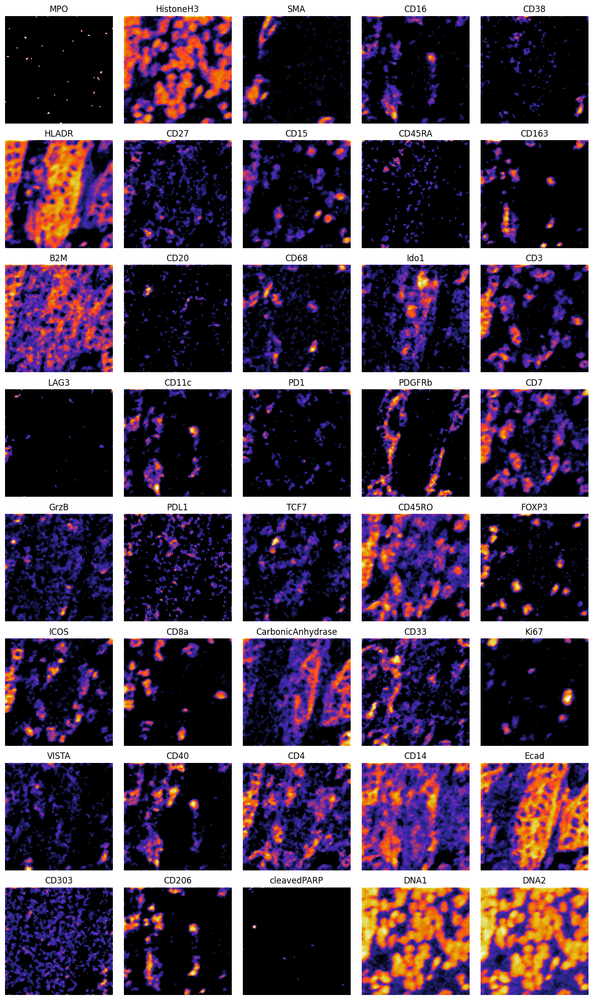

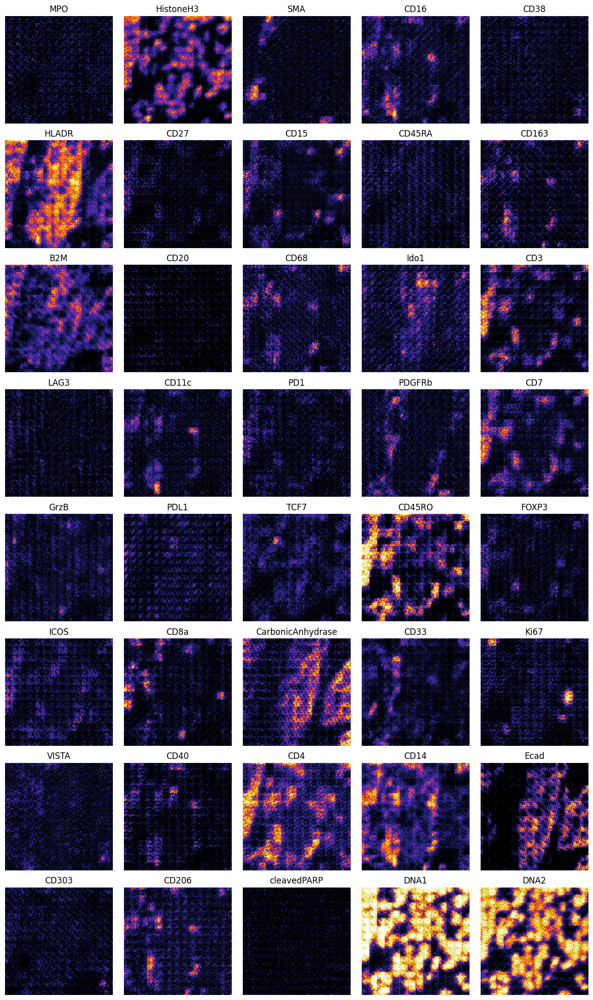

In [10]:
test_img, test_channel_ids = test_dataset[15]
test_img = test_img.to(torch.float32).to(device)
test_channel_ids = test_channel_ids.to(device)

test_img = test_img.unsqueeze(0)
test_channel_ids = test_channel_ids.unsqueeze(0)

with torch.no_grad():
    output, _ = model1(test_img, test_channel_ids, test_channel_ids)
    output = torch.sigmoid(output)

plot_markers(test_img.squeeze().cpu().numpy(), markers_names_map)
plot_markers(output.squeeze().cpu().numpy(), markers_names_map)

In [11]:
torch.save(model1.state_dict(), 'model1_pretrain_linear_biases_small.pth')

## Plain autoencoder, ViT

In [5]:
model_config = {
    'num_channels': 40,
    'input_image_size': 112,
    'superkernel_embedding_dim': 768,
    'superkernel_depth': 1,
    'superkernel_heads': 1,
    'superkernel_layer_type': 'plain',
    'superkernel_kernel_size': None,
    'mlp_ratio': 4.,
}

encoder_config = {
    "encoder_class": VisionTransformer,
    "num_classes": 0,
    'img_size': 112,
    'embed_dim': 768,
    "patch_size": 8,
    "in_chans": 768,
    'depth': 12,
    'num_heads': 8,
}

decoder_config = {
    'decoded_embed_dim': 512,
    'input_embedding_dim': 768,
    'num_blocks': 8,
    'scaling_factor': 8,
    'num_channels': 40,
    'decoder_layer_type': ConvNextBlock,
}

model11 = MultiplexTransformer(**model_config, encoder_config=encoder_config, decoder_config=decoder_config).to(device)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.num_heads is odd
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [6]:
criterion = partial(sigmoid_focal_loss, reduction='mean')

lr = 5e-4
weight_decay = 0.0001
gradient_accumulation_steps = 1
epochs = 20
num_warmup_steps = 100
num_training_steps = 2000
optimizer11 = optim.AdamW(model11.parameters(), lr=lr, weight_decay=weight_decay)
scheduler = get_cosine_schedule_with_warmup(optimizer11, num_warmup_steps, num_training_steps)

In [ ]:
run = neptune.init_run(
    project="dav3794/multiplex",
    api_token="==",
    tags=['ViT', 'plain superkernel', 'normal-ae',]
)

run["parameters"] = {
    "lr": lr,
    "weight_decay": weight_decay,
    "gradient_accumulation_steps": gradient_accumulation_steps,
    "epochs": epochs,
    "model_general_config": model_config,
    "encoder_config": encoder_config,
    "decoder_config": decoder_config,
}

train(
    model11, 
    optimizer11, 
    criterion, 
    scheduler,
    train_dataloader, 
    val_dataloader, 
    device, 
    epochs=epochs, 
    gradient_accumulation_steps=gradient_accumulation_steps,
    run=run
)

[neptune] [warning] NeptuneWarning: By default, these monitoring options are disabled in interactive sessions: 'capture_stdout', 'capture_stderr', 'capture_traceback', 'capture_hardware_metrics'. You can set them to 'True' when initializing the run and the monitoring will continue until you call run.stop() or the kernel stops. NOTE: To track the source files, pass their paths to the 'source_code' argument. For help, see: https://docs.neptune.ai/logging/source_code/


[neptune] [info   ] Neptune initialized. Open in the app: https://app.neptune.ai/dav3794/multiplex/e/MUL-25


[neptune] [warning] NeptuneUnsupportedType: You're attempting to log a type that is not directly supported by Neptune (<class 'NoneType'>).
        Convert the value to a supported type, such as a string or float, or use stringify_unsupported(obj)
        for dictionaries or collections that contain unsupported values.
        For more, see https://docs.neptune.ai/help/value_of_unsupported_type
[neptune] [warning] NeptuneUnsupportedType: You're attempting to log a type that is not directly supported by Neptune (<class 'type'>).
        Convert the value to a supported type, such as a string or float, or use stringify_unsupported(obj)
        for dictionaries or collections that contain unsupported values.
        For more, see https://docs.neptune.ai/help/value_of_unsupported_type
100%|██████████| 100/100 [04:08<00:00,  2.49s/it]


[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterTimeout
[neptune] [info   ] Communication with Neptune restored!
Validation loss: 0.03430616082623601


 27%|██▋       | 27/100 [01:07<03:00,  2.47s/it]

[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: HTTPServiceUnavailable


 96%|█████████▌| 96/100 [04:00<00:10,  2.53s/it]

[neptune] [info   ] Communication with Neptune restored!


100%|██████████| 100/100 [04:11<00:00,  2.51s/it]


Validation loss: 0.01852727006189525


100%|██████████| 100/100 [04:19<00:00,  2.59s/it]


Validation loss: 0.01572444968856871


  0%|          | 0/100 [00:00<?, ?it/s]

[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: HTTPServiceUnavailable


  4%|▍         | 4/100 [00:10<04:00,  2.50s/it]

[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterTimeout


 60%|██████    | 60/100 [02:36<01:46,  2.65s/it]

[neptune] [info   ] Communication with Neptune restored!


 93%|█████████▎| 93/100 [04:03<00:18,  2.64s/it]

[neptune] [info   ] Communication with Neptune restored!


100%|██████████| 100/100 [04:22<00:00,  2.62s/it]


Validation loss: 0.014519419064745307


  0%|          | 0/100 [00:00<?, ?it/s]

[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: HTTPServiceUnavailable


  2%|▏         | 2/100 [00:05<04:05,  2.50s/it]

[neptune] [info   ] Communication with Neptune restored!


100%|██████████| 100/100 [04:26<00:00,  2.66s/it]


Validation loss: 0.01416167100891471


100%|██████████| 100/100 [04:29<00:00,  2.69s/it]


Validation loss: 0.013636878654360772


100%|██████████| 100/100 [04:28<00:00,  2.68s/it]


Validation loss: 0.013390419827774168


100%|██████████| 100/100 [04:24<00:00,  2.65s/it]


Validation loss: 0.012986540580168366


100%|██████████| 100/100 [04:25<00:00,  2.66s/it]


Validation loss: 0.012874687919393182


100%|██████████| 100/100 [04:26<00:00,  2.66s/it]


Validation loss: 0.012668786514550447


100%|██████████| 100/100 [04:32<00:00,  2.73s/it]


Validation loss: 0.012546767890453338


100%|██████████| 100/100 [04:27<00:00,  2.67s/it]


Validation loss: 0.012412591520696879


100%|██████████| 100/100 [04:29<00:00,  2.69s/it]


Validation loss: 0.01229656212963164


100%|██████████| 100/100 [04:24<00:00,  2.64s/it]


Validation loss: 0.012154010869562627


100%|██████████| 100/100 [04:25<00:00,  2.66s/it]


Validation loss: 0.012102520801126957


100%|██████████| 100/100 [04:28<00:00,  2.68s/it]


Validation loss: 0.012083196183666586


100%|██████████| 100/100 [04:29<00:00,  2.70s/it]


Validation loss: 0.01203453676775098


100%|██████████| 100/100 [04:27<00:00,  2.67s/it]


Validation loss: 0.012011091951280832


100%|██████████| 100/100 [04:22<00:00,  2.63s/it]


Validation loss: 0.011999388271942735


100%|██████████| 100/100 [04:30<00:00,  2.71s/it]


Validation loss: 0.011994740599766374


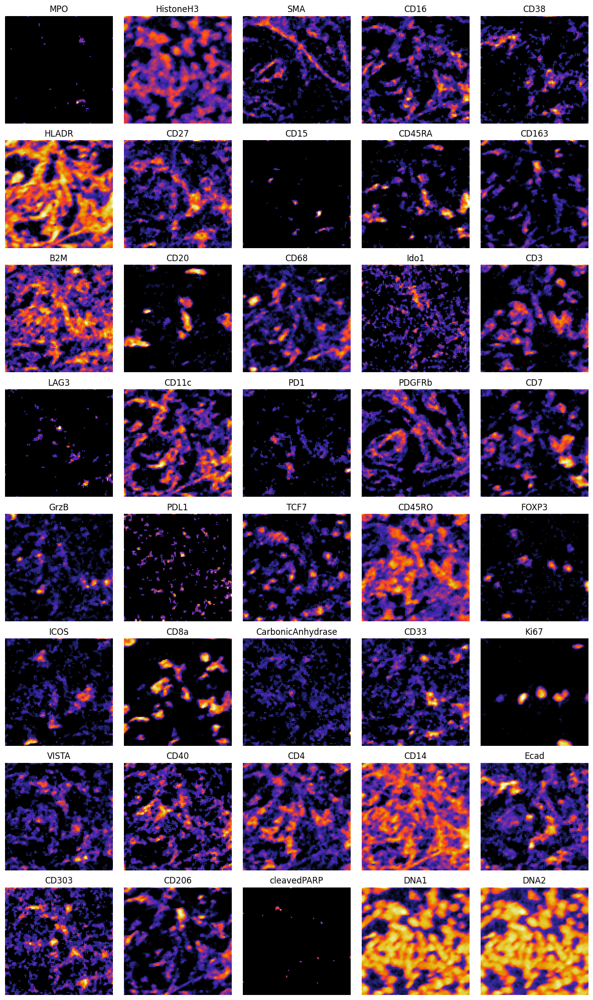

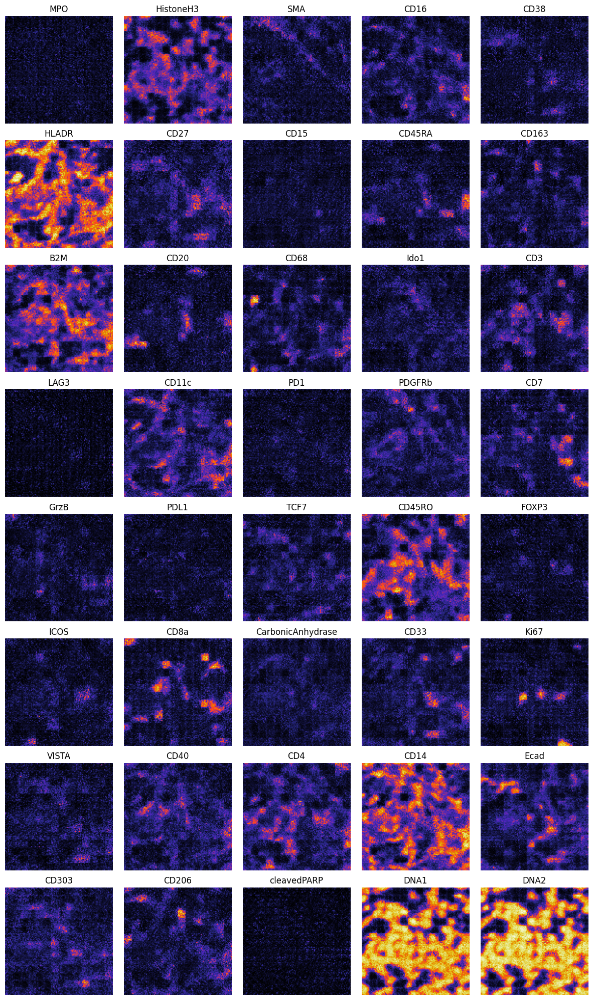

In [15]:
test_img, test_channel_ids = test_dataset[7]
test_img = test_img.to(torch.float32).to(device)
test_channel_ids = test_channel_ids.to(device)

test_img = test_img.unsqueeze(0)
test_channel_ids = test_channel_ids.unsqueeze(0)

with torch.no_grad():
    output, _ = model11(test_img, test_channel_ids, test_channel_ids)
    output = torch.sigmoid(output)

plot_markers(test_img.squeeze().cpu().numpy(), markers_names_map)
plot_markers(output.squeeze().cpu().numpy(), markers_names_map)

In [11]:
# save model
torch.save(model11.state_dict(), 'model11_pretrain_plain.pth')

### Finetune as masked

In [7]:
model_config = {
    'num_channels': 40,
    'input_image_size': 112,
    'superkernel_embedding_dim': 768,
    'superkernel_depth': 1,
    'superkernel_heads': 1,
    'superkernel_layer_type': 'plain',
    'superkernel_kernel_size': None,
    'mlp_ratio': 4.,
}

encoder_config = {
    "encoder_class": VisionTransformer,
    "num_classes": 0,
    'img_size': 112,
    'embed_dim': 768,
    "patch_size": 8,
    "in_chans": 768,
    'depth': 12,
    'num_heads': 8,
}

decoder_config = {
    'decoded_embed_dim': 512,
    'input_embedding_dim': 768,
    'num_blocks': 8,
    'scaling_factor': 8,
    'num_channels': 40,
    'decoder_layer_type': ConvNextBlock,
}

model11_tune = MultiplexTransformer(**model_config, encoder_config=encoder_config, decoder_config=decoder_config).to(device)
model11_tune.load_state_dict(torch.load('model11_pretrain_plain.pth'))

criterion = partial(sigmoid_focal_loss, reduction='mean')

lr = 5e-4
weight_decay = 0.0001
gradient_accumulation_steps = 1
epochs = 20
num_warmup_steps = 100
num_training_steps = 2000
optimizer11_tune = optim.AdamW(model11_tune.parameters(), lr=lr, weight_decay=weight_decay)
scheduler = get_cosine_schedule_with_warmup(optimizer11_tune, num_warmup_steps, num_training_steps)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.num_heads is odd
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [ ]:
run = neptune.init_run(
    project="dav3794/multiplex",
    api_token="==",
    tags=['ViT', 'plain superkernel', 'tuned-masked',]
)

run["parameters"] = {
    "lr": lr,
    "weight_decay": weight_decay,
    "gradient_accumulation_steps": gradient_accumulation_steps,
    "epochs": epochs,
    "model_general_config": model_config,
    "encoder_config": encoder_config,
    "decoder_config": decoder_config,
}

mask_step_iters = 100

train_masked(
    model11_tune, 
    optimizer11_tune, 
    criterion, 
    scheduler,
    train_dataloader, 
    val_dataloader, 
    device, 
    epochs=epochs, 
    gradient_accumulation_steps=gradient_accumulation_steps,
    run=run,
    mask_step_iters=mask_step_iters
)

[neptune] [warning] NeptuneWarning: By default, these monitoring options are disabled in interactive sessions: 'capture_stdout', 'capture_stderr', 'capture_traceback', 'capture_hardware_metrics'. You can set them to 'True' when initializing the run and the monitoring will continue until you call run.stop() or the kernel stops. NOTE: To track the source files, pass their paths to the 'source_code' argument. For help, see: https://docs.neptune.ai/logging/source_code/


[neptune] [info   ] Neptune initialized. Open in the app: https://app.neptune.ai/dav3794/multiplex/e/MUL-28


[neptune] [warning] NeptuneUnsupportedType: You're attempting to log a type that is not directly supported by Neptune (<class 'NoneType'>).
        Convert the value to a supported type, such as a string or float, or use stringify_unsupported(obj)
        for dictionaries or collections that contain unsupported values.
        For more, see https://docs.neptune.ai/help/value_of_unsupported_type
[neptune] [warning] NeptuneUnsupportedType: You're attempting to log a type that is not directly supported by Neptune (<class 'type'>).
        Convert the value to a supported type, such as a string or float, or use stringify_unsupported(obj)
        for dictionaries or collections that contain unsupported values.
        For more, see https://docs.neptune.ai/help/value_of_unsupported_type
Epoch 0: 100%|██████████| 100/100 [00:58<00:00,  1.72it/s]


Validation loss: 0.2439


Epoch 1: 100%|██████████| 100/100 [01:03<00:00,  1.57it/s]


Validation loss: 0.0878


Epoch 2: 100%|██████████| 100/100 [01:09<00:00,  1.44it/s]


Validation loss: 0.0741


Epoch 3: 100%|██████████| 100/100 [01:14<00:00,  1.34it/s]


Validation loss: 0.0476


Epoch 4: 100%|██████████| 100/100 [01:22<00:00,  1.22it/s]


Validation loss: 0.0367


Epoch 5: 100%|██████████| 100/100 [01:24<00:00,  1.18it/s]


Validation loss: 0.0274


Epoch 6: 100%|██████████| 100/100 [01:28<00:00,  1.13it/s]


Validation loss: 0.0225


Epoch 7: 100%|██████████| 100/100 [01:28<00:00,  1.13it/s]


Validation loss: 0.0193


Epoch 8: 100%|██████████| 100/100 [01:36<00:00,  1.04it/s]


Validation loss: 0.0185


Epoch 9: 100%|██████████| 100/100 [01:36<00:00,  1.04it/s]


Validation loss: 0.0171


Epoch 10: 100%|██████████| 100/100 [01:41<00:00,  1.01s/it]


Validation loss: 0.0163


Epoch 11: 100%|██████████| 100/100 [01:51<00:00,  1.12s/it]


Validation loss: 0.0157


Epoch 12: 100%|██████████| 100/100 [01:56<00:00,  1.16s/it]


Validation loss: 0.0154


Epoch 13: 100%|██████████| 100/100 [02:03<00:00,  1.24s/it]


Validation loss: 0.0153


Epoch 14: 100%|██████████| 100/100 [02:10<00:00,  1.31s/it]


Validation loss: 0.0154


Epoch 15: 100%|██████████| 100/100 [02:13<00:00,  1.34s/it]


Validation loss: 0.0153


Epoch 16: 100%|██████████| 100/100 [02:16<00:00,  1.36s/it]


Validation loss: 0.0157


Epoch 17: 100%|██████████| 100/100 [02:21<00:00,  1.41s/it]


Validation loss: 0.0159


Epoch 18: 100%|██████████| 100/100 [02:29<00:00,  1.49s/it]


Validation loss: 0.0164


Epoch 19: 100%|██████████| 100/100 [02:37<00:00,  1.57s/it]


Validation loss: 0.0164


In [9]:
torch.save(model11_tune.state_dict(), 'model11_tuned_plain.pth')

### Masked AE

In [ ]:
criterion = partial(sigmoid_focal_loss, reduction='mean')

lr = 5e-4
weight_decay = 0.0001
gradient_accumulation_steps = 1
epochs = 50
range_masked = (0.1, 0.5)
num_warmup_steps = 200
num_training_steps = 5000
optimizer1 = optim.AdamW(model1.parameters(), lr=lr, weight_decay=weight_decay)
scheduler = get_cosine_schedule_with_warmup(optimizer1, num_warmup_steps, num_training_steps)

run = neptune.init_run(
    project="dav3794/multiplex",
    api_token="==",
    tags=['ViT', 'linear superkernel', 'masked', 'add-means', 'bigger']
)

run["parameters"] = {
    "lr": lr,
    "weight_decay": weight_decay,
    "gradient_accumulation_steps": gradient_accumulation_steps,
    "epochs": epochs,
    "min_masked": range_masked[0],
    "max_masked": range_masked[1],
    "warmup_steps": num_warmup_steps,
    "training_steps": num_training_steps,
    "model_general_config": model_config,
    "encoder_config": encoder_config,
    "decoder_config": decoder_config,
}

[neptune] [warning] NeptuneWarning: By default, these monitoring options are disabled in interactive sessions: 'capture_stdout', 'capture_stderr', 'capture_traceback', 'capture_hardware_metrics'. You can set them to 'True' when initializing the run and the monitoring will continue until you call run.stop() or the kernel stops. NOTE: To track the source files, pass their paths to the 'source_code' argument. For help, see: https://docs.neptune.ai/logging/source_code/


[neptune] [info   ] Neptune initialized. Open in the app: https://app.neptune.ai/dav3794/multiplex/e/MUL-15


[neptune] [warning] NeptuneUnsupportedType: You're attempting to log a type that is not directly supported by Neptune (<class 'NoneType'>).
        Convert the value to a supported type, such as a string or float, or use stringify_unsupported(obj)
        for dictionaries or collections that contain unsupported values.
        For more, see https://docs.neptune.ai/help/value_of_unsupported_type
[neptune] [warning] NeptuneUnsupportedType: You're attempting to log a type that is not directly supported by Neptune (<class 'type'>).
        Convert the value to a supported type, such as a string or float, or use stringify_unsupported(obj)
        for dictionaries or collections that contain unsupported values.
        For more, see https://docs.neptune.ai/help/value_of_unsupported_type


In [7]:
train_masked(
    model1, 
    optimizer1, 
    criterion, 
    scheduler,
    train_dataloader, 
    val_dataloader, 
    device, 
    epochs=epochs, 
    gradient_accumulation_steps=gradient_accumulation_steps,
    run=run,
    range_masked=range_masked
)
run.stop()

Epoch 0: 100%|██████████| 100/100 [01:57<00:00,  1.17s/it]


Validation loss: 0.0706


Epoch 1: 100%|██████████| 100/100 [01:56<00:00,  1.16s/it]


Validation loss: 0.0661


Epoch 2: 100%|██████████| 100/100 [01:54<00:00,  1.15s/it]


Validation loss: 0.0482


Epoch 3: 100%|██████████| 100/100 [01:58<00:00,  1.19s/it]


Validation loss: 0.0595


Epoch 4: 100%|██████████| 100/100 [01:58<00:00,  1.19s/it]


Validation loss: 0.0323


Epoch 5: 100%|██████████| 100/100 [01:56<00:00,  1.16s/it]


Validation loss: 0.0281


Epoch 6: 100%|██████████| 100/100 [01:52<00:00,  1.13s/it]


Validation loss: 0.0395


Epoch 7: 100%|██████████| 100/100 [01:56<00:00,  1.16s/it]


Validation loss: 0.0404


Epoch 8: 100%|██████████| 100/100 [01:52<00:00,  1.13s/it]


Validation loss: 0.0371


Epoch 9: 100%|██████████| 100/100 [01:56<00:00,  1.17s/it]


Validation loss: 0.0339


Epoch 10: 100%|██████████| 100/100 [01:57<00:00,  1.17s/it]


Validation loss: 0.0285


Epoch 11: 100%|██████████| 100/100 [01:56<00:00,  1.16s/it]


Validation loss: 0.0240


Epoch 12: 100%|██████████| 100/100 [01:52<00:00,  1.13s/it]


Validation loss: 0.0251


Epoch 13: 100%|██████████| 100/100 [01:56<00:00,  1.17s/it]


Validation loss: 0.0192


Epoch 14: 100%|██████████| 100/100 [01:51<00:00,  1.12s/it]


Validation loss: 0.0254


Epoch 15: 100%|██████████| 100/100 [01:55<00:00,  1.16s/it]


Validation loss: 0.0202


Epoch 16: 100%|██████████| 100/100 [01:53<00:00,  1.13s/it]


Validation loss: 0.0224


Epoch 17: 100%|██████████| 100/100 [01:52<00:00,  1.12s/it]


Validation loss: 0.0268


Epoch 18: 100%|██████████| 100/100 [01:56<00:00,  1.17s/it]


Validation loss: 0.0196


Epoch 19: 100%|██████████| 100/100 [01:56<00:00,  1.17s/it]


Validation loss: 0.0231


Epoch 20: 100%|██████████| 100/100 [01:55<00:00,  1.16s/it]


Validation loss: 0.0305


Epoch 21: 100%|██████████| 100/100 [01:53<00:00,  1.14s/it]


Validation loss: 0.0181


Epoch 22: 100%|██████████| 100/100 [01:54<00:00,  1.14s/it]


Validation loss: 0.0220


Epoch 23: 100%|██████████| 100/100 [01:51<00:00,  1.12s/it]


Validation loss: 0.0190


Epoch 24: 100%|██████████| 100/100 [01:53<00:00,  1.13s/it]


Validation loss: 0.0178


Epoch 25: 100%|██████████| 100/100 [01:56<00:00,  1.17s/it]


Validation loss: 0.0164


Epoch 26: 100%|██████████| 100/100 [01:56<00:00,  1.16s/it]


Validation loss: 0.0163


Epoch 27: 100%|██████████| 100/100 [01:56<00:00,  1.16s/it]


Validation loss: 0.0183


Epoch 28: 100%|██████████| 100/100 [01:53<00:00,  1.13s/it]


Validation loss: 0.0169


Epoch 29: 100%|██████████| 100/100 [01:53<00:00,  1.13s/it]


Validation loss: 0.0165


Epoch 30: 100%|██████████| 100/100 [01:56<00:00,  1.17s/it]


Validation loss: 0.0162


Epoch 31: 100%|██████████| 100/100 [01:55<00:00,  1.15s/it]


Validation loss: 0.0156


Epoch 32: 100%|██████████| 100/100 [01:55<00:00,  1.15s/it]


Validation loss: 0.0161


Epoch 33: 100%|██████████| 100/100 [01:51<00:00,  1.12s/it]


Validation loss: 0.0157


Epoch 34: 100%|██████████| 100/100 [01:53<00:00,  1.14s/it]


Validation loss: 0.0154


Epoch 35: 100%|██████████| 100/100 [01:57<00:00,  1.17s/it]


Validation loss: 0.0158


Epoch 36: 100%|██████████| 100/100 [01:54<00:00,  1.15s/it]


Validation loss: 0.0151


Epoch 37: 100%|██████████| 100/100 [01:56<00:00,  1.16s/it]


Validation loss: 0.0154


Epoch 38: 100%|██████████| 100/100 [01:55<00:00,  1.16s/it]


Validation loss: 0.0153


Epoch 39: 100%|██████████| 100/100 [01:54<00:00,  1.14s/it]


Validation loss: 0.0152


Epoch 40: 100%|██████████| 100/100 [01:51<00:00,  1.12s/it]


Validation loss: 0.0149


Epoch 41: 100%|██████████| 100/100 [01:52<00:00,  1.12s/it]


Validation loss: 0.0151


Epoch 42: 100%|██████████| 100/100 [01:50<00:00,  1.10s/it]


Validation loss: 0.0149


Epoch 43: 100%|██████████| 100/100 [01:53<00:00,  1.14s/it]


Validation loss: 0.0148


Epoch 44: 100%|██████████| 100/100 [01:55<00:00,  1.16s/it]


Validation loss: 0.0148


Epoch 45: 100%|██████████| 100/100 [01:55<00:00,  1.15s/it]


Validation loss: 0.0148


Epoch 46: 100%|██████████| 100/100 [01:57<00:00,  1.17s/it]


Validation loss: 0.0147


Epoch 47: 100%|██████████| 100/100 [01:53<00:00,  1.13s/it]


Validation loss: 0.0147


Epoch 48: 100%|██████████| 100/100 [01:55<00:00,  1.15s/it]


Validation loss: 0.0147


Epoch 49: 100%|██████████| 100/100 [01:53<00:00,  1.13s/it]


Validation loss: 0.0147
[neptune] [info   ] Shutting down background jobs, please wait a moment...
[neptune] [info   ] Done!
[neptune] [info   ] Waiting for the remaining 2 operations to synchronize with Neptune. Do not kill this process.
[neptune] [info   ] All 2 operations synced, thanks for waiting!
[neptune] [info   ] Explore the metadata in the Neptune app: https://app.neptune.ai/dav3794/multiplex/e/MUL-15/metadata


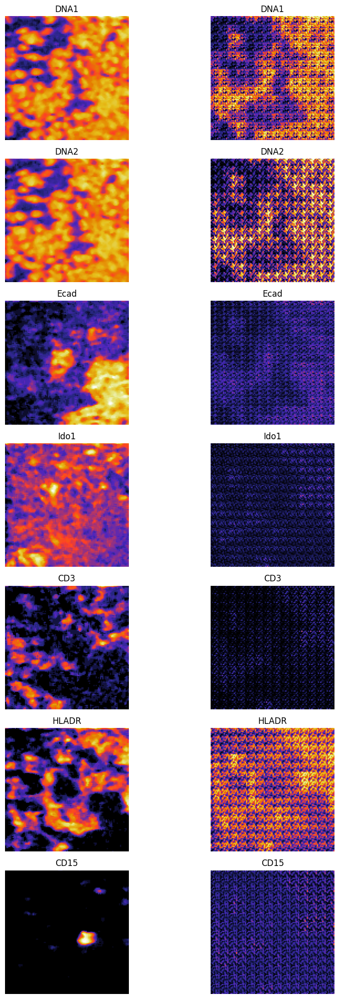

In [18]:
import json 
import matplotlib.pyplot as plt

tokenizer_vocab = json.load(open('tokenizer_vocab.json'))

mask_channel_names = [
    'DNA1',
    'DNA2',
    'Ecad',
    'Ido1',
    'CD3',
    'HLADR',
    'CD15'
]

mask_channel_ids = [tokenizer_vocab[name] for name in mask_channel_names]

test_img, test_channel_ids = test_dataset[16]
test_img = test_img.to(torch.float32).to(device)
test_channel_ids = test_channel_ids.to(device)

avail_channels_ids = torch.tensor([i for i in test_channel_ids if i not in mask_channel_ids]).to(device)
masked_channels_ids = torch.tensor(mask_channel_ids).unsqueeze(0).to(device)

test_img = test_img.unsqueeze(0)

input_masked_img = test_img[:, avail_channels_ids]
test_channel_ids = avail_channels_ids.unsqueeze(0)

with torch.no_grad():
    output, _ = model1(input_masked_img, test_channel_ids, masked_channels_ids)
    output = torch.sigmoid(output)

# plot_markers(test_img.squeeze().cpu().numpy(), markers_names_map)
# plot_markers(output.squeeze().cpu().numpy(), markers_names_map)

fig, axs = plt.subplots(len(mask_channel_ids), 2, figsize=(10, 20))
for i, channel in enumerate(mask_channel_ids):
    axs[i, 0].imshow(test_img.squeeze().cpu().numpy()[channel], cmap='CMRmap', vmin=0, vmax=1)
    axs[i, 1].imshow(output.squeeze().cpu().numpy()[i], cmap='CMRmap', vmin=0, vmax=1)
    axs[i, 0].axis('off')
    axs[i, 1].axis('off')
    axs[i, 0].set_title(markers_names_map[channel])
    axs[i, 1].set_title(markers_names_map[channel])
# for i in range(40):
#     axs[i, 0].imshow(test_img.squeeze().cpu().numpy()[i], cmap='CMRmap', vmin=0, vmax=1)
#     axs[i, 1].imshow(output.squeeze().cpu().numpy()[i], cmap='CMRmap', vmin=0, vmax=1)
#     axs[i, 0].axis('off')
#     axs[i, 1].axis('off')
#     axs[i, 0].set_title(markers_names_map[i])
#     axs[i, 1].set_title(markers_names_map[i])

plt.tight_layout()
plt.show()

## Convolutional plain superkernel, ViT

In [7]:
model_config = {
    'num_channels': 40,
    'input_image_size': 112,
    'superkernel_embedding_dim': 256,
    'superkernel_depth': 0,
    'superkernel_heads': 0,
    'superkernel_layer_type': 'conv',
    'superkernel_kernel_size': 3,
    'superkernel_conv_padding': 1,
    'mlp_ratio': 4.,
}

encoder_config = {
    "encoder_class": VisionTransformer,
    "num_classes": 0,
    'img_size': 112,
    'embed_dim': 768,
    "patch_size": 8,
    "in_chans": 256,
    'depth': 12,
    'num_heads': 8,
}

decoder_config = {
    'decoded_embed_dim': 512,
    'input_embedding_dim': 768,
    'num_blocks': 8,
    'scaling_factor': 8,
    'num_channels': 40,
    'decoder_layer_type': ConvNextBlock,
}

model4 = MultiplexTransformer(**model_config, encoder_config=encoder_config, decoder_config=decoder_config).to(device)

### Basic autoencoder training

In [8]:
criterion = partial(sigmoid_focal_loss, reduction='mean')

lr = 5e-4
weight_decay = 0.0001
gradient_accumulation_steps = 1
epochs = 20
num_warmup_steps = 100
num_training_steps = 20000
optimizer4 = optim.AdamW(model4.parameters(), lr=lr, weight_decay=weight_decay)
scheduler = get_cosine_schedule_with_warmup(optimizer4, num_warmup_steps, num_training_steps)

In [ ]:
run = neptune.init_run(
    project="dav3794/multiplex",
    api_token="==",
    tags=['ViT', 'convolutional plain superkernel', 'shuffle-ae', 'custom-sa', 'decoder biases', 'small superkernel' ]
)

run["parameters"] = {
    "lr": lr,
    "weight_decay": weight_decay,
    "gradient_accumulation_steps": gradient_accumulation_steps,
    "epochs": epochs,
    "model_general_config": model_config,
    "encoder_config": encoder_config,
    "decoder_config": decoder_config,
}

train(
    model4, 
    optimizer4, 
    criterion, 
    scheduler,
    train_dataloader, 
    val_dataloader, 
    device, 
    epochs=epochs, 
    gradient_accumulation_steps=gradient_accumulation_steps,
    run=run
)

[neptune] [warning] NeptuneWarning: By default, these monitoring options are disabled in interactive sessions: 'capture_stdout', 'capture_stderr', 'capture_traceback', 'capture_hardware_metrics'. You can set them to 'True' when initializing the run and the monitoring will continue until you call run.stop() or the kernel stops. NOTE: To track the source files, pass their paths to the 'source_code' argument. For help, see: https://docs.neptune.ai/logging/source_code/


[neptune] [info   ] Neptune initialized. Open in the app: https://app.neptune.ai/dav3794/multiplex/e/MUL-48


[neptune] [warning] NeptuneUnsupportedType: You're attempting to log a type that is not directly supported by Neptune (<class 'type'>).
        Convert the value to a supported type, such as a string or float, or use stringify_unsupported(obj)
        for dictionaries or collections that contain unsupported values.
        For more, see https://docs.neptune.ai/help/value_of_unsupported_type
100%|██████████| 100/100 [03:34<00:00,  2.15s/it]


Validation loss: 0.034875168837606906


 33%|███▎      | 33/100 [01:09<02:19,  2.08s/it]

[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError


100%|██████████| 100/100 [03:33<00:00,  2.13s/it]


Validation loss: 0.01923903252929449


 14%|█▍        | 14/100 [00:30<03:07,  2.18s/it]

[neptune] [info   ] Communication with Neptune restored!


 42%|████▏     | 42/100 [01:34<02:20,  2.43s/it]

[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError


100%|██████████| 100/100 [03:44<00:00,  2.24s/it]


Validation loss: 0.016848233472555877


  0%|          | 0/100 [00:00<?, ?it/s]

[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: ConnectionError


  2%|▏         | 2/100 [00:04<03:18,  2.03s/it]

[neptune] [info   ] Communication with Neptune restored!


100%|██████████| 100/100 [03:37<00:00,  2.17s/it]


Validation loss: 0.016136709172278642


100%|██████████| 100/100 [03:33<00:00,  2.14s/it]


Validation loss: 0.015484605021774768


100%|██████████| 100/100 [03:34<00:00,  2.15s/it]


Validation loss: 0.014878076231107117


100%|██████████| 100/100 [03:37<00:00,  2.17s/it]


Validation loss: 0.014132123375311494


100%|██████████| 100/100 [03:35<00:00,  2.15s/it]


Validation loss: 0.014101929152384401


100%|██████████| 100/100 [03:37<00:00,  2.18s/it]


Validation loss: 0.013725801268592477


100%|██████████| 100/100 [03:35<00:00,  2.15s/it]


Validation loss: 0.014120967388153076


100%|██████████| 100/100 [03:32<00:00,  2.12s/it]


Validation loss: 0.01420531254261732


100%|██████████| 100/100 [03:36<00:00,  2.16s/it]


Validation loss: 0.013192608198150992


100%|██████████| 100/100 [03:41<00:00,  2.21s/it]


Validation loss: 0.013299778318032623


100%|██████████| 100/100 [03:40<00:00,  2.20s/it]


Validation loss: 0.012982655400410294


100%|██████████| 100/100 [03:36<00:00,  2.17s/it]


Validation loss: 0.013843299690634012


100%|██████████| 100/100 [03:37<00:00,  2.18s/it]


Validation loss: 0.012669171392917632


100%|██████████| 100/100 [03:33<00:00,  2.13s/it]


Validation loss: 0.012707710573449731


100%|██████████| 100/100 [03:33<00:00,  2.13s/it]


Validation loss: 0.01908897429704666


100%|██████████| 100/100 [03:33<00:00,  2.13s/it]


Validation loss: 0.01339760448783636


100%|██████████| 100/100 [03:38<00:00,  2.18s/it]


Validation loss: 0.01354809938929975


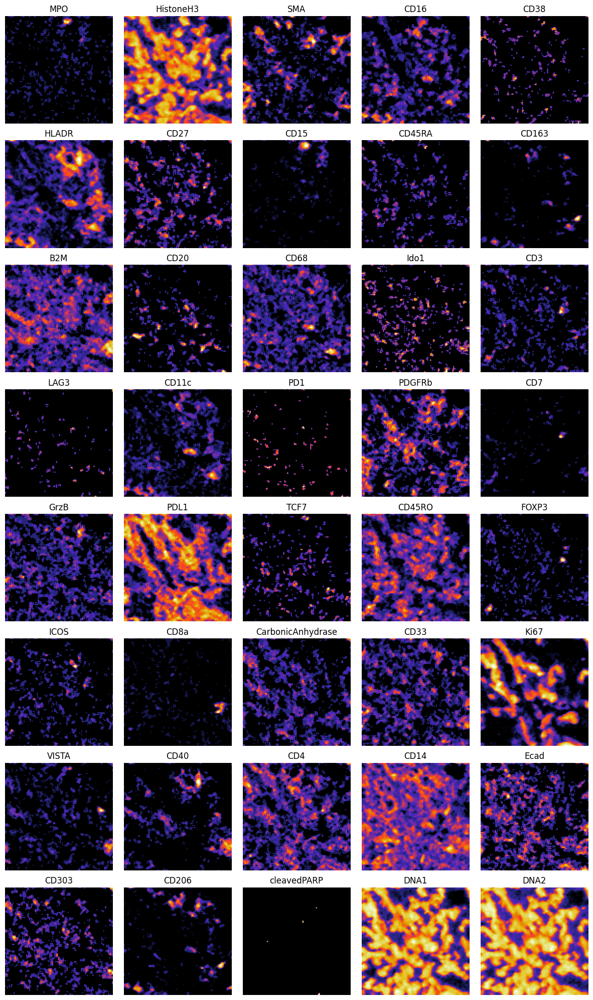

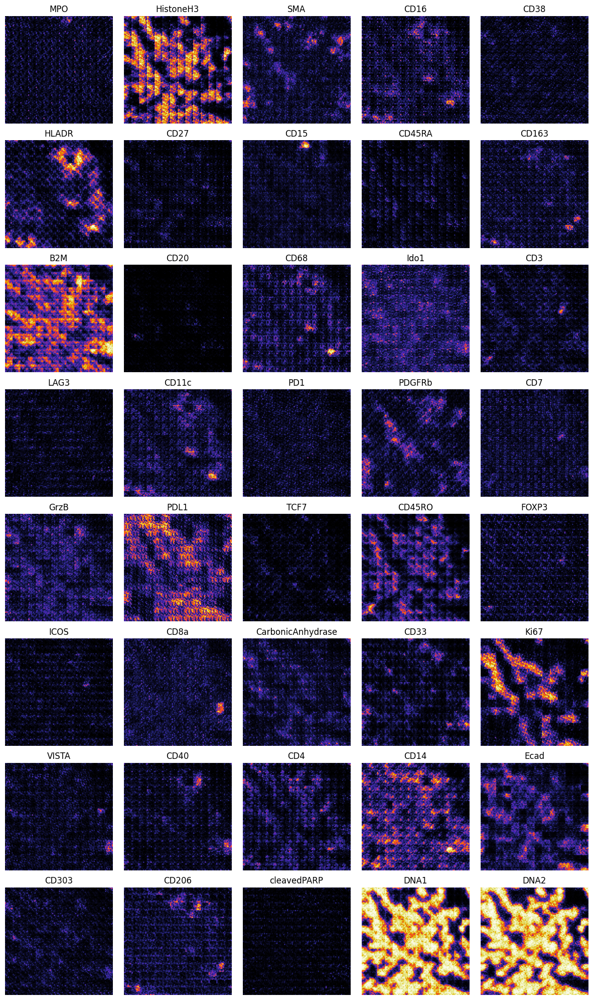

In [15]:
test_img, test_channel_ids = test_dataset[8]
test_img = test_img.to(torch.float32).to(device)
test_channel_ids = test_channel_ids.to(device)

test_img = test_img.unsqueeze(0)
test_channel_ids = test_channel_ids.unsqueeze(0)

with torch.no_grad():
    output, _ = model4(test_img, test_channel_ids, test_channel_ids)
    output = torch.sigmoid(output)

plot_markers(test_img.squeeze().cpu().numpy(), markers_names_map)
plot_markers(output.squeeze().cpu().numpy(), markers_names_map)

In [11]:
torch.save(model4.state_dict(), 'model4_pretrain_convolut_plain.pth')

### Finetune as masked

In [12]:
model_config = {
    'num_channels': 40,
    'input_image_size': 112,
    'superkernel_embedding_dim': 256,
    'superkernel_depth': 0,
    'superkernel_heads': 0,
    'superkernel_layer_type': 'conv',
    'superkernel_kernel_size': 3,
    'superkernel_conv_padding': 1,
    'mlp_ratio': 4.,
}

encoder_config = {
    "encoder_class": VisionTransformer,
    "num_classes": 0,
    'img_size': 112,
    'embed_dim': 768,
    "patch_size": 8,
    "in_chans": 256,
    'depth': 12,
    'num_heads': 8,
}

decoder_config = {
    'decoded_embed_dim': 512,
    'input_embedding_dim': 768,
    'num_blocks': 8,
    'scaling_factor': 8,
    'num_channels': 40,
    'decoder_layer_type': ConvNextBlock,
}

model4_tune = MultiplexTransformer(**model_config, encoder_config=encoder_config, decoder_config=decoder_config).to(device)
model4_tune.load_state_dict(torch.load('model4_pretrain_convolut_plain.pth'))

criterion = partial(sigmoid_focal_loss, reduction='mean')

lr = 5e-4
final_lr = 1e-6
weight_decay = 0.0001
gradient_accumulation_steps = 1
epochs = 50
num_warmup_steps = 100
num_annealing_steps = 1000
optimizer4_tune = optim.AdamW(model4_tune.parameters(), lr=lr, weight_decay=weight_decay)
scheduler = get_scheduler_with_warmup(optimizer4_tune, num_warmup_steps, num_annealing_steps, final_lr=final_lr, type='cosine')

In [ ]:
run = neptune.init_run(
    project="dav3794/multiplex",
    api_token="==",
    tags=['ViT', 'conv plain superkernel', 'tuned-masked', 'without-mean-addition', 'decoder biases']
)

run["parameters"] = {
    "lr": lr,
    "weight_decay": weight_decay,
    "gradient_accumulation_steps": gradient_accumulation_steps,
    "epochs": epochs,
    "model_general_config": model_config,
    "encoder_config": encoder_config,
    "decoder_config": decoder_config,
}

mask_step_iters = 500

train_masked(
    model4_tune, 
    optimizer4_tune, 
    criterion, 
    scheduler,
    train_dataloader, 
    val_dataloader, 
    device, 
    epochs=epochs, 
    gradient_accumulation_steps=gradient_accumulation_steps,
    run=run,
    mask_step_iters=mask_step_iters
)

[neptune] [info   ] Neptune initialized. Open in the app: https://app.neptune.ai/dav3794/multiplex/e/MUL-49


Epoch 0: 100%|██████████| 100/100 [00:50<00:00,  1.98it/s]


Validation loss: 0.2332


Epoch 1: 100%|██████████| 100/100 [00:50<00:00,  1.99it/s]


Validation loss: 0.1011


Epoch 2: 100%|██████████| 100/100 [00:49<00:00,  2.01it/s]


Validation loss: 0.0933


Epoch 3: 100%|██████████| 100/100 [00:49<00:00,  2.02it/s]


Validation loss: 0.0716


Epoch 4: 100%|██████████| 100/100 [00:50<00:00,  1.99it/s]


Validation loss: 0.0730


Epoch 5: 100%|██████████| 100/100 [00:56<00:00,  1.77it/s]


Validation loss: 0.0723


Epoch 6: 100%|██████████| 100/100 [00:56<00:00,  1.78it/s]


Validation loss: 0.0648


Epoch 7: 100%|██████████| 100/100 [00:56<00:00,  1.78it/s]


Validation loss: 0.0506


Epoch 8: 100%|██████████| 100/100 [00:56<00:00,  1.78it/s]


Validation loss: 0.0502


Epoch 9: 100%|██████████| 100/100 [00:55<00:00,  1.79it/s]


Validation loss: 0.0686


Epoch 10: 100%|██████████| 100/100 [01:01<00:00,  1.62it/s]


Validation loss: 0.0603


Epoch 11: 100%|██████████| 100/100 [01:01<00:00,  1.62it/s]


Validation loss: 0.0527


Epoch 12:  62%|██████▏   | 62/100 [00:38<00:23,  1.61it/s]

[neptune] [info   ] Communication with Neptune restored!


Epoch 12: 100%|██████████| 100/100 [01:01<00:00,  1.62it/s]


Validation loss: 0.0427


Epoch 13:  55%|█████▌    | 55/100 [00:33<00:27,  1.61it/s]

[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError


Epoch 13: 100%|██████████| 100/100 [01:02<00:00,  1.60it/s]


Validation loss: 0.0395


Epoch 14: 100%|██████████| 100/100 [01:02<00:00,  1.60it/s]


Validation loss: 0.0552


Epoch 15: 100%|██████████| 100/100 [01:07<00:00,  1.48it/s]


Validation loss: 0.0517


Epoch 16: 100%|██████████| 100/100 [01:07<00:00,  1.49it/s]


Validation loss: 0.0463


Epoch 17: 100%|██████████| 100/100 [01:07<00:00,  1.49it/s]


Validation loss: 0.0441


Epoch 18: 100%|██████████| 100/100 [01:07<00:00,  1.49it/s]


Validation loss: 0.0420


Epoch 19: 100%|██████████| 100/100 [01:07<00:00,  1.49it/s]


Validation loss: 0.0413


Epoch 20: 100%|██████████| 100/100 [01:12<00:00,  1.39it/s]


Validation loss: 0.0326


Epoch 21: 100%|██████████| 100/100 [01:11<00:00,  1.39it/s]


Validation loss: 0.0261


Epoch 22: 100%|██████████| 100/100 [01:11<00:00,  1.40it/s]


Validation loss: 0.0247


Epoch 23: 100%|██████████| 100/100 [01:11<00:00,  1.39it/s]


Validation loss: 0.0245


Epoch 24: 100%|██████████| 100/100 [01:12<00:00,  1.37it/s]


Validation loss: 0.0219


Epoch 25: 100%|██████████| 100/100 [01:17<00:00,  1.30it/s]


Validation loss: 0.0203


Epoch 26: 100%|██████████| 100/100 [01:16<00:00,  1.30it/s]


Validation loss: 0.0211


Epoch 27: 100%|██████████| 100/100 [01:17<00:00,  1.29it/s]


Validation loss: 0.0237


Epoch 28: 100%|██████████| 100/100 [01:16<00:00,  1.30it/s]


Validation loss: 0.0249


Epoch 29:  88%|████████▊ | 88/100 [01:08<00:09,  1.29it/s]

[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError


Epoch 29: 100%|██████████| 100/100 [01:17<00:00,  1.29it/s]


Validation loss: 0.0187


Epoch 30:  25%|██▌       | 25/100 [00:20<01:01,  1.21it/s]

[neptune] [info   ] Communication with Neptune restored!


Epoch 30: 100%|██████████| 100/100 [01:21<00:00,  1.23it/s]


Validation loss: 0.0152


Epoch 31: 100%|██████████| 100/100 [01:21<00:00,  1.22it/s]


Validation loss: 0.0144


Epoch 32: 100%|██████████| 100/100 [01:21<00:00,  1.23it/s]


Validation loss: 0.0144


Epoch 33: 100%|██████████| 100/100 [01:21<00:00,  1.23it/s]


Validation loss: 0.0145


Epoch 34: 100%|██████████| 100/100 [01:22<00:00,  1.22it/s]


Validation loss: 0.0136


Epoch 35: 100%|██████████| 100/100 [01:25<00:00,  1.16it/s]


Validation loss: 0.0268


Epoch 36: 100%|██████████| 100/100 [01:25<00:00,  1.17it/s]


Validation loss: 0.0208


Epoch 37: 100%|██████████| 100/100 [01:25<00:00,  1.16it/s]


Validation loss: 0.0175


Epoch 38: 100%|██████████| 100/100 [01:26<00:00,  1.16it/s]


Validation loss: 0.0205


Epoch 39: 100%|██████████| 100/100 [01:26<00:00,  1.16it/s]


Validation loss: 0.0157


Epoch 40:  72%|███████▏  | 72/100 [01:05<00:25,  1.11it/s]

[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError


Epoch 40: 100%|██████████| 100/100 [01:30<00:00,  1.10it/s]


Validation loss: 0.0144


Epoch 41: 100%|██████████| 100/100 [01:30<00:00,  1.11it/s]


Validation loss: 0.0142


Epoch 42: 100%|██████████| 100/100 [01:30<00:00,  1.11it/s]


Validation loss: 0.0138


Epoch 43: 100%|██████████| 100/100 [01:29<00:00,  1.11it/s]


Validation loss: 0.0128


Epoch 44: 100%|██████████| 100/100 [01:30<00:00,  1.11it/s]


Validation loss: 0.0155


Epoch 45: 100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Validation loss: 0.0187


Epoch 46: 100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Validation loss: 0.0224


Epoch 47: 100%|██████████| 100/100 [01:34<00:00,  1.06it/s]


Validation loss: 0.0156


Epoch 48:  37%|███▋      | 37/100 [00:34<00:58,  1.07it/s]

[neptune] [info   ] Communication with Neptune restored!


Epoch 48: 100%|██████████| 100/100 [01:33<00:00,  1.07it/s]


Validation loss: 0.0138
[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError


Epoch 49: 100%|██████████| 100/100 [01:33<00:00,  1.07it/s]


Validation loss: 0.0136


[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError
[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError
[neptune] [info   ] Communication with Neptune restored!
[neptune] [info   ] Communication with Neptune restored!
[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterTimeout
[neptune] [info   ] Communication with Neptune restored!
[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterTimeout
[neptune] [info   ] Communication with Neptune restored!
[neptune] [info   ] Communication with Neptune restored!
[neptune] [warning] Experiencing connection

In [17]:
torch.save(model4_tune.state_dict(), 'model4_masked_convolut_plain.pth')